<a href="https://colab.research.google.com/github/ForniLucas/TSP-Ant-Colony-Optimization/blob/main/ACO.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:

import numpy as np

#    Función: Crea un modelo de TSP con coordenadas de ciudades y una matriz de distancias.
#    Output: Devuelve un diccionario llamado 'model' que contiene:
#    x e y: Arreglos que contienen las coordenadas x e y de las ciudades.
#    n: Número de ciudades.
#    D: Matriz de distancias.
#    xmin, xmax, ymin, ymax: Límites para las coordenadas x e y.
def create_model():
    # Coordenadas x e y de las ciudades
    x = np.array([82, 91, 12, 92, 63, 9, 28, 55, 96, 97, 15, 98, 96, 49, 80, 14, 42, 92, 80, 96])
    y = np.array([66, 3, 85, 94, 68, 76, 75, 39, 66, 17, 71, 3, 27, 4, 9, 83, 70, 32, 95, 3])

    n = len(x)  # Número de ciudades

    D = np.zeros((n, n))  # Matriz de distancias inicializada con ceros

    # Calcula las distancias entre las ciudades
    for i in range(n-1):
        for j in range(i+1, n):
            D[i, j] = np.sqrt((x[i]-x[j])**2 + (y[i]-y[j])**2)
            D[j, i] = D[i, j]

    # Definición de los límites x e y
    xmin = 0
    xmax = 100
    ymin = 0
    ymax = 100

    # Creacion del diccionario llamado 'model'
    model = {
        'xmin': xmin,
        'xmax': xmax,
        'ymin': ymin,
        'ymax': ymax,
        'n': n,
        'x': x,
        'y': y,
        'D': D
    }

    return model

In [ ]:
def print_distance_matrix(model):
    print("Distance Matrix:")
    print(model['D'])

# Example usage:
model = create_model()
print_distance_matrix(model)

Distance Matrix:
[[  0.          63.63961031  72.53275122  29.73213749  19.10497317
   73.68174808  54.74486277  38.18376618  14.          51.2445119
   67.18630813  65.          41.43669871  70.23531875  57.03507693
   70.09279564  40.19950248  35.44009029  29.06888371  64.5368112 ]
 [ 63.63961031   0.         113.86395391  91.00549434  70.77428912
  109.78615578  95.67131231  50.91168825  63.19810124  15.23154621
  101.98039027   7.          24.51530134  42.01190308  12.52996409
  111.03603019  83.00602388  29.01723626  92.65527508   5.        ]
 [ 72.53275122 113.86395391   0.          80.50465825  53.75872022
    9.48683298  18.86796226  62.96824597  86.12200648 108.85311204
   14.31782106 118.82760622 102.07840124  89.05054744 101.98039027
    2.82842712  33.54101966  95.96353474  68.73136111 117.38824473]
 [ 29.73213749  91.00549434  80.50465825   0.          38.94868419
   84.92938243  66.76076692  66.28725368  28.28427125  77.1621669
   80.36168241  91.19758769  67.11929678  99

In [ ]:
#    Función: Calcula la longitud total del recorrido en el TSP, es decir, la distancia total que se recorre al visitar todas las ciudades y regresar a la ciudad inicial.

#input:
    #tour: Una lista que representa un recorrido de ciudades. Cada elemento de la lista es un índice que representa una ciudad en el modelo.
    #model: Un diccionario que contiene información sobre el problema TSP, incluyendo las coordenadas de las ciudades y una matriz de distancias entre ellas.


#Output: Retorna la longitud total del recorrido.
def tour_length(tour, model):
    n = len(tour)  # Obtiene el número de ciudades en el recorrido

    tour = tour + [tour[0]]  # Añade la primera ciudad al final para completar el recorrido circular

    L = 0  # Inicializa la longitud del recorrido

    # Itera sobre el recorrido
    for i in range(n):
        # Accede a la matriz de distancias del modelo y acumula la longitud del recorrido
        # Se resta 1 para ajustar el índice, ya que Python usa índices basados en 0
        L += model['D'][tour[i]-1, tour[i+1]-1]

    return L  # Retorna la longitud total del recorrido


**El propósito de la función roulette_wheel_selection(P)** es seleccionar un índice de un arreglo P de probabilidades dado. imita el proceso de selección en una ruleta de casino. En una ruleta, los sectores más grandes (que representan eventos más probables) tienen una mayor área y, por lo tanto, una mayor probabilidad de ser seleccionados cuando la ruleta gira.

Supongamos que tenemos un arreglo P que representa las probabilidades de seleccionar diferentes elementos. Esta función ayuda a elegir un índice de manera que los elementos con mayores probabilidades tengan una mayor probabilidad de ser seleccionados.

Aquí hay un ejemplo simplificado: supongamos que P es [0.2, 0.3, 0.1, 0.4]. Esto significa que el primer elemento tiene una probabilidad del 20%, el segundo del 30%, el tercero del 10% y el cuarto del 40%.

La función roulette_wheel_selection(P) generará un número aleatorio entre 0 y 1 (por ejemplo, 0.25). Luego, calculará la suma acumulativa de las probabilidades en P, que sería [0.2, 0.5, 0.6, 1.0]. A continuación, buscará el primer índice donde el número aleatorio (0.25) sea menor o igual a la suma acumulativa. En este caso, sería el segundo índice, lo que significa que el elemento correspondiente en P (en este caso, el segundo elemento) será seleccionado.

Esta selección basada en probabilidades es fundamental en ACO, ya que permite a las hormigas tomar decisiones sobre qué acción tomar a continuación, equilibrando entre explorar nuevas posibilidades y explotar las mejores soluciones conocidas.

In [ ]:
import random  # genera números aleatorios
import numpy as np

#Funcion: Implementa la selección de la ruleta para elegir un índice basado en probabilidades.
#Input: Un array P de probabilidades.
#Output: se devuelve el índice j, que será utilizado para seleccionar un elemento basado en las probabilidades proporcionadas en P.

def roulette_wheel_selection(P):
    r = random.random()  # Genera un número de punto flotante aleatorio entre 0 y 1
    C = np.cumsum(P)  # Calcula la suma acumulativa de los elementos en el arreglo 'P'
    j = np.argmax(r <= C)  # Encuentra el primer índice donde r es menor o igual que 'C'
    return j


#Esta función es fundamental para el algoritmo ACO porque permite a las hormigas tomar decisiones sobre qué ciudad visitar a continuación.
#La selección de la siguiente ciudad se basa en las feromonas depositadas y en la información heurística (en el cálculo de P), lo que equilibra la exploración y la explotación del espacio de búsqueda.

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

#Funcion: Grafica la solucion

#Input:
#     tour: Una lista que representa un recorrido de ciudades. Cada elemento es un índice que representa una ciudad en el modelo.
#     model: Un diccionario que contiene información sobre el problema TSP, incluyendo las coordenadas de las ciudades y una matriz de distancias entre ellas.
#     name: Un nombre para el gráfico.

#Output: Grafico
def plot_solution(tour, model, name):
    # Agregar la primer ciudad al final del recorrido para cerrar el ciclo
    tour = np.append(tour, tour[0])

    # Graficar el recorrido
    plt.plot(model['x'][tour], model['y'][tour], 'k-o',
             markersize=10, markerfacecolor='y', linewidth=1.5)

    # Etiquetas de los ejes y el título del gráfico
    plt.xlabel('x')
    plt.ylabel('y')
    plt.title(name)

    # Establecer el aspecto de los ejes como igual
    plt.axis('equal')

    # Habilitar la cuadrícula en el gráfico
    plt.grid(True)

    # Factor de ajuste
    alpha = 0.1

    # Ajustar los límites del eje x
    xmin = min(model['x'])
    xmax = max(model['x'])
    dx = xmax - xmin
    xmin = np.floor((xmin - alpha*dx)/10)*10
    xmax = np.ceil((xmax + alpha*dx)/10)*10
    plt.xlim([xmin, xmax])

    # Ajustar los límites del eje y
    ymin = min(model['y'])
    ymax = max(model['y'])
    dy = ymax - ymin
    ymin = np.floor((ymin - alpha*dy)/10)*10
    ymax = np.ceil((ymax + alpha*dy)/10)*10
    plt.ylim([ymin, ymax])

    # Añadir etiquetas a cada punto
    for i in range(model['n']):
        t = f'P {i+1}'
        plt.text(model['x'][tour[i]], model['y'][tour[i]], t,
                 horizontalalignment='left', verticalalignment='bottom')

    # Mostrar el gráfico
    plt.show()



In [ ]:
import matplotlib.pyplot as plt
import numpy as np


#Funcion: Grafica los niveles de feromonas.
#Input:
#      model: Un diccionario que contiene información sobre el problema TSP, incluyendo las coordenadas de las ciudades y una matriz de distancias entre ellas.
#      tau: Una matriz de niveles de feromonas.representa los niveles de feromonas entre las ciudades. Cada valor de tau[i, j] indica la cantidad de feromonas entre las ciudades i y j
#      name: Un nombre para el gráfico.

#Output: grafico.

def plot_pheromones(model, tau, name):
    # Crear una figura y ejes para el gráfico
    fig, ax = plt.subplots()

    # Determinar el valor máximo de tau para escalar el colormap
    max_tau = np.max(tau)

    # Crear un mapa de colores
    cmap = plt.get_cmap('viridis')  # Se puede cambiar 'viridis' por cualquier otro mapa de colores

    # Iterar sobre las ciudades del modelo
    for i in range(model['n']):
        x_0 = model['x'][i]  # Coordenada x de la ciudad i
        y_0 = model['y'][i]  # Coordenada y de la ciudad i

        # Iterar sobre las ciudades desde la ciudad i hasta la última
        for j in range(i, model['n']):
            if i != j:
                param = tau[i, j] / max_tau  # Normalizar tau para el mapa de colores (ajusta los valores de tau de manera que se encuentren dentro de un rango específico que sea adecuado para la representación gráfica en un colormap.)
                x_1 = model['x'][j]  # Coordenada x de la ciudad j
                y_1 = model['y'][j]  # Coordenada y de la ciudad j

                # Coordenadas de inicio y fin para la línea
                x = [x_0, x_1]
                y = [y_0, y_1]

                # Dibujar una línea con marcadores en los extremos
                ax.plot(x, y, '-', color=cmap(param), linewidth=2.5)

    # Establecer etiquetas y título
    ax.set_xlabel('x')
    ax.set_ylabel('y')
    ax.set_title(name)

    # Habilitar la cuadrícula en el gráfico
    ax.grid(True)

    # Ajustes para los límites de los ejes x e y
    alpha = 0.1
    xmin = min(model['x'])
    xmax = max(model['x'])
    dx = xmax - xmin
    xmin = np.floor((xmin - alpha*dx) / 10) * 10
    xmax = np.ceil((xmax + alpha*dx) / 10) * 10
    ax.set_xlim([xmin, xmax])

    ymin = min(model['y'])
    ymax = max(model['y'])
    dy = ymax - ymin
    ymin = np.floor((ymin - alpha*dy) / 10) * 10
    ymax = np.ceil((ymax + alpha*dy) / 10) * 10
    ax.set_ylim([ymin, ymax])

    # Agregar una barra de colores con el argumento 'ax'
    sm = plt.cm.ScalarMappable(cmap=cmap, norm=plt.Normalize(0, max_tau))
    sm.set_array([])
    plt.colorbar(sm, ax=ax, label='Tau')

    # Mostrar la figura
    plt.show()


Una "hormiga" es una entidad abstracta que representa un agente que busca soluciones en un espacio de búsqueda. Cada hormiga construye una solución al problema es decir, una hormiga construye un recorrido que visita todas las ciudades exactamente una vez y regresa al punto de partida.

Las hormigas siguen una regla de selección para determinar qué ciudad visitar a continuación. Esta regla depende de la influencia de las feromonas y de la información heurística.

Después de construir una solución, la hormiga deposita feromonas en los bordes del grafo que ha recorrido. Las feromonas depositadas influyen en las decisiones futuras de otras hormigas.

A través de múltiples iteraciones, las hormigas colaboran para explorar el espacio de soluciones y gradualmente convergen hacia una solución óptima o cercana a la óptima.

n_ant representa el número de hormigas que participan en la búsqueda de soluciones en cada iteración del algoritmo. Más hormigas pueden explorar un espacio de búsqueda más amplio, pero también pueden aumentar el tiempo de ejecución del algoritmo. Un número adecuado de hormigas es crucial para un equilibrio óptimo entre exploración y explotación.

Por "feromona" se habla de una sustancia ficticia utilizada para modelar el comportamiento de las hormigas y comunicar información sobre la calidad de las soluciones en un espacio de búsqueda. Una especie de "memoria colectiva" del comportamiento de las hormigas. Indican la calidad de los caminos o soluciones en el espacio de búsqueda del problema que se está resolviendo. Cuanto más fuerte es la feromona en un camino, más probable es que las hormigas futuras lo elijan.

Las feromonas se actualizan dinámicamente durante el proceso de búsqueda. Cuando una hormiga completa su recorrido y encuentra una solución, deposita feromonas en los bordes del grafo que ha recorrido. La cantidad de feromona depositada suele ser inversamente proporcional a la calidad de la solución: mejores soluciones reciben más feromona.

A medida que las hormigas siguen explorando, las feromonas se evaporan gradualmente, lo que simula el paso del tiempo y evita la convergencia prematura hacia soluciones subóptimas.

Q es un parámetro que controla la cantidad de feromonas que se deposita en el camino seguido por una hormiga después de completar un recorrido. Q influye en la tasa a la que las feromonas se acumulan en los bordes del grafo. Valores más altos de Q significan que se deposita más feromona,resultando en una mayor influencia de las feromonas en la elección de las rutas por parte de las hormigas. Por otro lado, valores más bajos de Q disminuirán el impacto de las feromonas en la elección de rutas. La selección adecuada de Q es importante para el desempeño óptimo del algoritmo ACO y puede depender del problema específico que se esté abordando.

tau0 es el nivel inicial de feromonas en todos los bordes del grafo al comienzo del algoritmo. tau0 establece una base inicial para las feromonas. Un valor adecuado de tau0 puede ayudar a equilibrar la exploración y la explotación en las primeras etapas del algoritmo.

rho representa la tasa a la que las feromonas se evaporan entre iteraciones del algoritmo. La evaporación de feromonas simula el paso del tiempo y ayuda a evitar la convergencia prematura hacia soluciones subóptimas. Un valor adecuado de rho controla la rapidez con la que las feromonas disminuyen.

En ACO, hay dos influencias principales que guían el comportamiento de las hormigas al elegir su próximo movimiento:

  Influencia de las Feromonas (**alpha**): Este parámetro controla cuánto peso se le da a la información de feromonas al tomar decisiones. Un valor alto de alpha hace que las hormigas confíen más en las feromonas al elegir su siguiente ciudad.

  Influencia de la Información Heurística (**beta**): Este parámetro controla cuánto peso se le da a la información heurística, que en el caso del TSP suele ser la distancia entre ciudades. Un valor alto de beta hace que las hormigas confíen más en la información de distancia al elegir su siguiente ciudad.

In [ ]:
import numpy as np


#Funcion:implementa una versión básica de Ant Colony Optimization para resolver TSP.

#Input:
#      model: Un diccionario que contiene información sobre el problema TSP. Incluye las coordenadas de las ciudades y una matriz de distancias entre ellas.
#      cost_function: Una función que calcula el costo de un recorrido dado. En este caso, cost_function se refiere a tour_length, que calcula la longitud total del recorrido en el TSP.
#      max_it: Número máximo de iteraciones que el algoritmo realizará.
#      n_ant: Número de hormigas, el tamaño de la población.
#      Q: controla la cantidad de feromonas que se depositan en las aristas durante la actualización de feromonas.
#      tau0: Nivel inicial de feromonas.
#      alpha: controla la influencia de las feromonas en la decisión de las hormigas.
#      beta:  controla la influencia de la información heurística (distancias entre ciudades) en la decisión de las hormigas.
#      rho: Tasa de evaporación de feromonas.


def simple_aco(model, cost_function, max_it, n_ant, Q, tau0, alpha, beta, rho):
    figs = plt.get_fignums()  # Obtiene los números de las figuras ya existentes
    num_figs = len(figs)  # Cuenta la cantidad de figuras

    print('\nSIMPLE ACO\n')


    n_var = model['n']  # Número de ciudadesvariables del modelo
    eta = 1 / model['D']  # Calcula la matriz de información heurística, que es el inverso de las distancias.  (Tengo que arreglar un warning de division por cero)
    tau = tau0 * np.ones((n_var, n_var))  #  Inicializa la matriz de feromonas con valores iguales a tau0.
    best_cost = np.zeros(max_it)  # Arreglo para almacenar los mejores costos en cada iteración

#    Se define una hormiga vacía como un diccionario con dos claves: 'Tour' y 'Cost'.
#    'Tour' será una lista que representará el recorrido de ciudades que realizará la hormiga.
#    'Cost' representará el costo total del recorrido de la hormiga.
    empty_ant = {'Tour': [], 'Cost': []}

#   Se crea una lista llamada ants que contendrá n_ant hormigas.
#   Utiliza una comprensión de lista ([...]) para llenar la lista con copias de la hormiga vacía (empty_ant). Cada hormiga en la lista es independiente y tiene su propio recorrido y costo.
    ants = [empty_ant.copy() for _ in range(n_ant)]

    best_sol = {'Cost': float('inf')}  #  Inicializa la mejor solución encontrada con un costo infinitamente grande.

    # Bucle principal de ACO
    for it in range(max_it):  #Se ejecutara el algoritmo de ACO durante un número máximo de iteraciones.
        # Mover las hormigas
        for k in range(n_ant): #Este bucle itera sobre todas las hormigas en la población.
            ants[k]['Tour'] = [np.random.randint(1, n_var+1) - 1]  # Ciudad inicial de cada hormiga k. Se elige una ciudad aleatoria como punto de partida.
            for l in range(1, n_var): #permite a la hormiga moverse a través de las ciudades restantes.
                i = ants[k]['Tour'][-1]  # Última ciudad visitada por la hormiga
                P = (tau[i, :] ** alpha) * (eta[i, :] ** beta)  # Cálculo de las probabilidades
                P[ants[k]['Tour']] = 0  # Las ciudades visitadas se les da probabilidad 0
                P = P / np.sum(P)  # Normalización de las probabilidades
                j = roulette_wheel_selection(P)  # Próxima ciudad a visitar
                ants[k]['Tour'].append(j)  # Agregar la ciudad al tour de la hormiga

            ants[k]['Cost'] = cost_function(ants[k]['Tour'])  # Calcular el costo del tour

            if ants[k]['Cost'] < best_sol['Cost']:  # Actualizar la mejor solución si es necesario
                best_sol = ants[k].copy()
                it_best = it + 1

        # Actualizar las feromonas
        for k in range(n_ant):  #Se recorre cada hormiga (k) en el bucle principal.
            tour = ants[k]['Tour']  #Se obtiene el recorrido de la hormiga k.
            tour.append(tour[0])  # Se agrega la primera ciudad al final del recorrido para formar un circuito cerrado.
            for l in range(n_var):  #Se itera sobre las ciudades
                #Se obtienen los índices de las ciudades i y j en la matriz de feromonas, restando 1 para ajustar por el hecho de que los índices en Python comienzan en 0.
                i = tour[l] - 1
                j = tour[l + 1] - 1
                tau[i, j] += Q / ants[k]['Cost']  #Se actualiza la cantidad de feromonas entre las ciudades i y j al agregar una cantidad proporcional a Q dividido por el costo del recorrido de la hormiga k

        tau = (1 - rho) * tau  # Evaporación de las feromonas

        best_cost[it] = best_sol['Cost']  # Almacenar el mejor costo de esta iteración

        print(f'Iteración {it+1}: Mejor Costo = {best_cost[it]}')  # Muestra información de la iteración

        plt.figure(num_figs + 1)
        graph_name = f'Solución ACO Simple\nIteración {it+1}: Mejor Costo = {best_cost[it]}'
        plot_solution(best_sol['Tour'], model, graph_name)  # Graficar la solución
        graph_phe= f'Feromonas ACO Simple\nIteración {it+1}'
        plot_pheromones(model,tau,graph_phe)

        plt.pause(0.01)  # Pausa para mostrar la gráfica

    plt.figure()
    plt.plot(best_cost, linewidth=2)
    plt.xlabel('Iteración')
    plt.ylabel('Mejor Costo')
    plt.title('ACO Simple')
    plt.grid(True)

    plot_pheromones(model, tau, 'Feromonas ACO Simple')  # Graficar las feromonas
    solution = [best_cost[-1], it_best]
    plt.pause(1)  # Pausa antes de cerrar la gráfica
    return solution


In [ ]:
#Funcion: Ordena una lista de hormigas según sus costos.
#Input:
#     ants: Una lista de hormigas, donde cada hormiga está representada por un diccionario con un 'Tour' y 'Cost'.
#Output:Retorna una lista ordenada de hormigas.

def sort_ants(ants):
    # Caso base: si hay 1 o menos hormigas, la lista ya está ordenada
    if len(ants) <= 1:
        return ants
    else:
        # Se selecciona la primera hormiga como pivote
        piv = ants[0]['Cost']
        # Se crean dos listas vacías para las hormigas menores y mayores que el pivote
        l = []
        g = []
        # Se recorren las hormigas a partir de la segunda
        for i in range(1, len(ants)):
            # Si el costo de la hormiga es menor o igual que el pivote, se agrega a la lista de menores
            if ants[i]['Cost'] <= piv:
                l.append(ants[i])
            else:
                # Si es mayor, se agrega a la lista de mayores
                g.append(ants[i])
        # Se aplica recursivamente la función a las listas de menores y mayores
        l = sort_ants(l)
        g = sort_ants(g)
        # Se concatenan las listas de menores, el pivote y las mayores en ese orden
        sorted_ants = l + [ants[0]] + g
        return sorted_ants


In [ ]:
#Funcion: Selecciona las mejores n hormigas con los costos más bajos.
#Input:
#    ants: Una lista de hormigas, donde cada hormiga está representada por un diccionario con un 'Tour' y 'Cost'.
#    n: Número de hormigas élite a seleccionar.
#Output:Retorna una lista de hormigas élite.
def elitist_ants(ants, n):
    # Inicializa una lista vacía para almacenar las hormigas elitistas
    elit_ants = []

    # Inicializa el valor máximo de costo como -1 (un valor menor que cualquier posible costo)
    max_cost = -1

    # Itera sobre las hormigas y selecciona las mejores
    i = 0
    while len(elit_ants) < n and i < len(ants):
        ant = ants[i]  # Obtiene la hormiga actual
        if round(ant['Cost'] * 1000) / 1000 > round(max_cost * 1000) / 1000:
            # Si el costo de la hormiga actual es mayor que el costo máximo encontrado hasta ahora
            # Se añade a la lista de hormigas elitistas y se actualiza el costo máximo
            elit_ants.append(ant)
            max_cost = ant['Cost']
        i += 1  # Incrementa el índice para pasar a la siguiente hormiga

    return elit_ants  # Devuelve la lista de hormigas elitistas


In [ ]:
#Funcion:implementa una variante de ACO, "ACO Elitista". Esta variante prioriza la explotación de las mejores soluciones encontradas hasta el momento para resolver TSP.

#Input:
#      model: Un diccionario que contiene información sobre el problema TSP. Incluye las coordenadas de las ciudades y una matriz de distancias entre ellas.
#      cost_function: Una función que calcula el costo de un recorrido dado. En este caso, cost_function se refiere a tour_length, que calcula la longitud total del recorrido en el TSP.
#      max_it: Número máximo de iteraciones que el algoritmo realizará.
#      n_ant: Número de hormigas, el tamaño de la población.
#      Q: controla la cantidad de feromonas que se depositan en las aristas durante la actualización de feromonas.
#      tau0: Nivel inicial de feromonas.
#      alpha: controla la influencia de las feromonas en la decisión de las hormigas.
#      beta:  controla la influencia de la información heurística (distancias entre ciudades) en la decisión de las hormigas.
#      rho: Tasa de evaporación de feromonas.
#      p: Porcentaje de hormigas consideradas élite.


def elitist_aco(model, cost_function, max_it, n_ant, Q, tau0, alpha, beta, rho, p):
    figs = plt.get_fignums()
    num_figs = len(figs)

    print('\nELITIST ACO\n')

    n_best_ants = int(n_ant * p)  # Número de hormigas consideradas las mejores

    # Inicialización
    n_var = model['n']  # Número de variables (ciudades)
    eta = 1 / model['D']  # Matriz de información heurística, inverso de las distancias (warning de division por 0)
    tau = tau0 * np.ones((n_var, n_var))  # Matriz de feromonas inicializada a partir de tau0
    best_cost = np.zeros(max_it)  # Array para almacenar los mejores costos

    empty_ant = {'Tour': [], 'Cost': []}  # Estructura de una hormiga vacía
    ants = [empty_ant.copy() for _ in range(n_ant)]  # Lista de hormigas

    best_sol = {'Cost': float('inf')}  # Mejor solución encontrada

    # Bucle principal del ACO
    for it in range(max_it):  #Se ejecutara el algoritmo de ACO durante un número máximo de iteraciones.
        # Mover las hormigas
        for k in range(n_ant): #Este bucle itera sobre todas las hormigas en la población.
            ants[k]['Tour'] = [np.random.randint(1, n_var+1) - 1]  # Ciudad inicial de cada hormiga k. Se elige una ciudad aleatoria como punto de partida.
            for l in range(1, n_var): #permite a la hormiga moverse a través de las ciudades restantes.
                i = ants[k]['Tour'][-1]  # Última ciudad visitada por la hormiga
                P = (tau[i, :] ** alpha) * (eta[i, :] ** beta)  # Cálculo de las probabilidades
                P[ants[k]['Tour']] = 0  # Las ciudades visitadas se les da probabilidad 0
                P = P / np.sum(P)  # Normalización de las probabilidades
                j = roulette_wheel_selection(P)  # Próxima ciudad a visitar
                ants[k]['Tour'].append(j)  # Agregar la ciudad al tour de la hormiga

            ants[k]['Cost'] = cost_function(ants[k]['Tour'])  # Calcular el costo del tour

            if ants[k]['Cost'] < best_sol['Cost']:  # Actualizar la mejor solución si es necesario
                best_sol = ants[k].copy()
                it_best = it + 1

        # Actualiza las feromonas
        #sorted_ants = sort_ants(ants)  # Ordena las hormigas por costo

        elit_ants = elitist_ants(ants, n_best_ants) # Selecciona las mejores hormigas

        for k in range(len(elit_ants)):  #inicia un bucle que itera sobre todas las hormigas consideradas élite.
            tour = elit_ants[k]['Tour'] #se obtiene el tour de la k-ésima hormiga élite. tour será una lista que representa el recorrido de la hormiga.
            tour.append(tour[0])

            for l in range(n_var):
                i = tour[l] - 1
                j = tour[l + 1] - 1
                tau[i, j] += Q / elit_ants[k]['Cost'] #    Esta es la parte clave de la actualización de feromonas. Se incrementa el valor de feromonas en la ruta de la ciudad i a la ciudad j.
                                                      #    La cantidad en la que se incrementa depende del parámetro Q y del costo del tour de la hormiga élite.

        tau = (1 - rho) * tau  # Evaporación de feromonas

        best_cost[it] = best_sol['Cost']  # Almacena el mejor costo

        print(f'Iteración {it + 1}: Mejor Costo = {best_cost[it]}')  # Muestra información de la iteración

        plt.figure(num_figs + 1)
        graph_name = f'Solución ACO Elitista\nIteración {it + 1}: Mejor Costo = {best_cost[it]}'
        plot_solution(best_sol['Tour'], model, graph_name)  # Grafica la solución
        graph_phe= f'Feromonas ACO Elitista\nIteración {it+1}'
        plot_pheromones(model,tau,graph_phe)

        plt.pause(0.01)

    # Resultados finales
    plt.figure()
    plt.plot(best_cost, linewidth=2)
    plt.xlabel('Iteración')
    plt.ylabel('Mejor Costo')
    plt.title('ACO Elitista')
    plt.grid(True)

    plot_pheromones(model, tau, 'Feromonas ACO Elitista')
    solution = [best_cost[-1], it_best]  # Mejor costo y número de iteración correspondiente
    plt.pause(1)

    return solution  # Devuelve la solución



SIMPLE ACO

Iteración 1: Mejor Costo = 990.1099541384982


<ipython-input-64-a4f3aa7c5934>:26: RuntimeWarning: divide by zero encountered in divide
  eta = 1 / model['D']  # Calcula la matriz de información heurística, que es el inverso de las distancias.  (Tengo que arreglar un warning de division por cero)


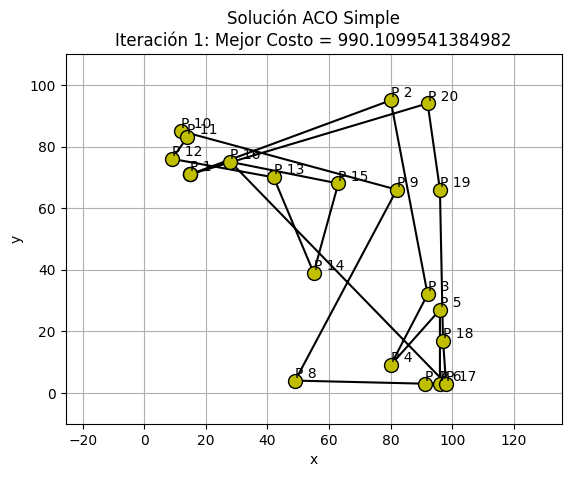

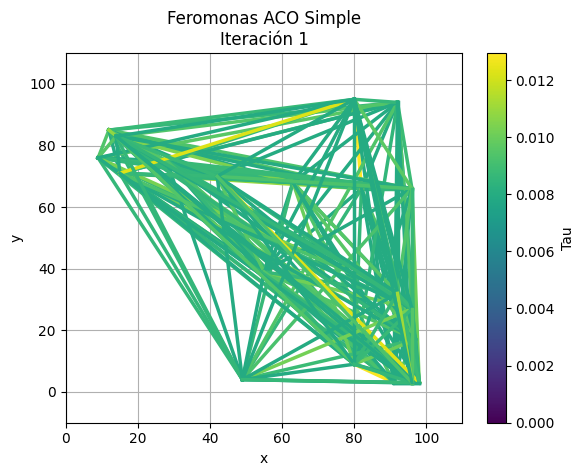

Iteración 2: Mejor Costo = 988.5649649426023


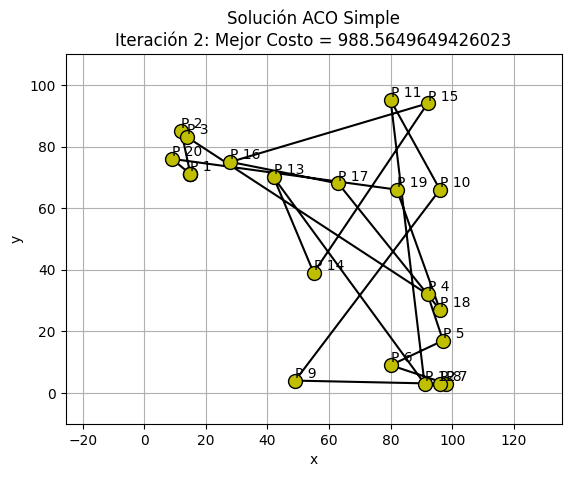

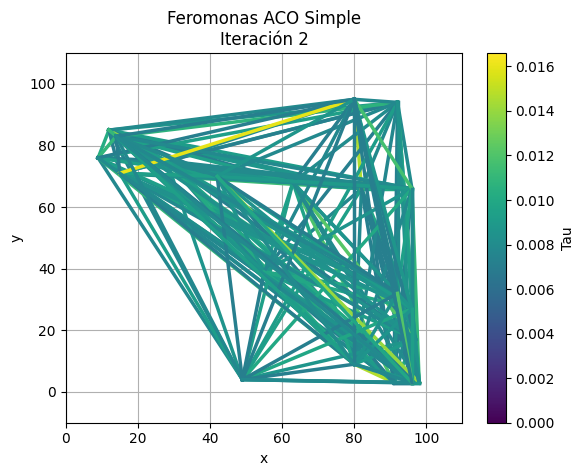

Iteración 3: Mejor Costo = 983.5465015961538


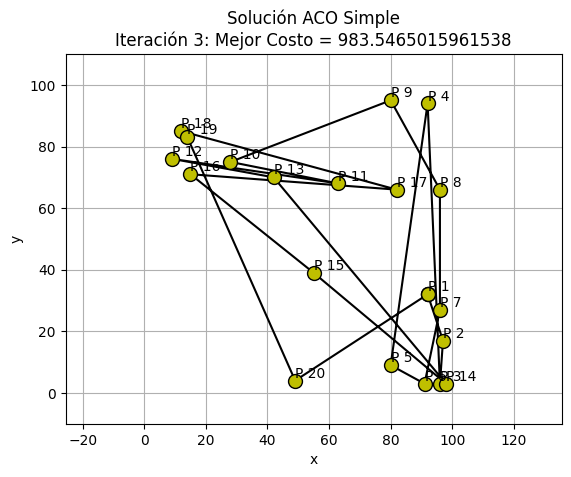

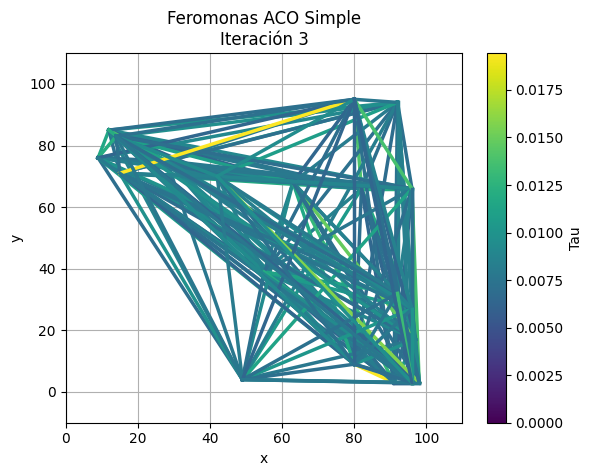

Iteración 4: Mejor Costo = 950.2440570784768


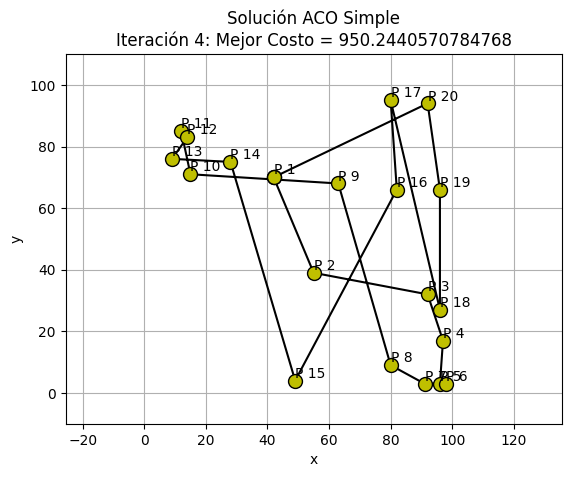

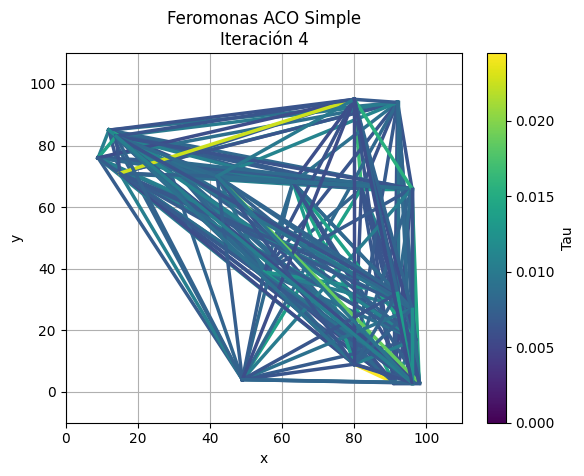

Iteración 5: Mejor Costo = 950.2440570784768


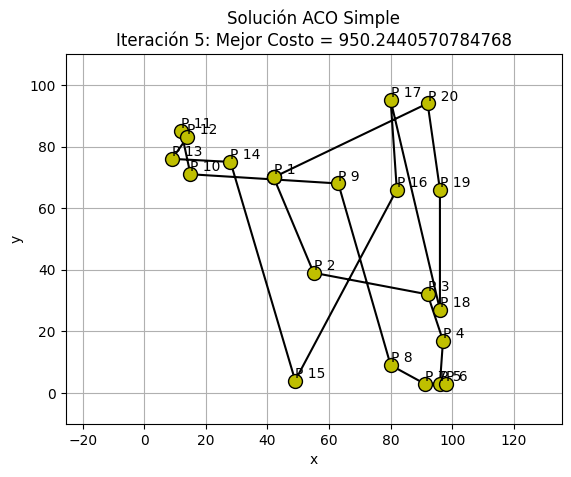

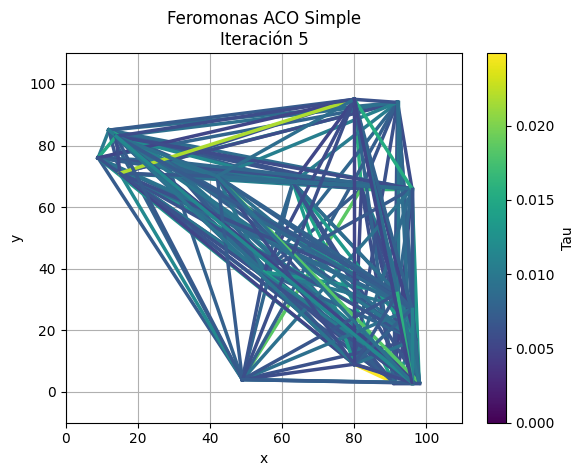

Iteración 6: Mejor Costo = 950.2440570784768


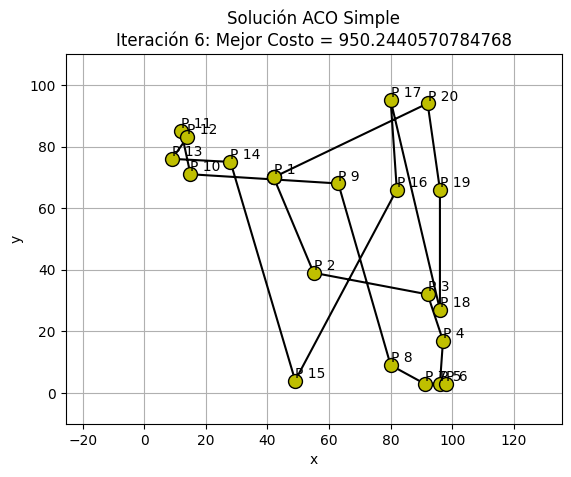

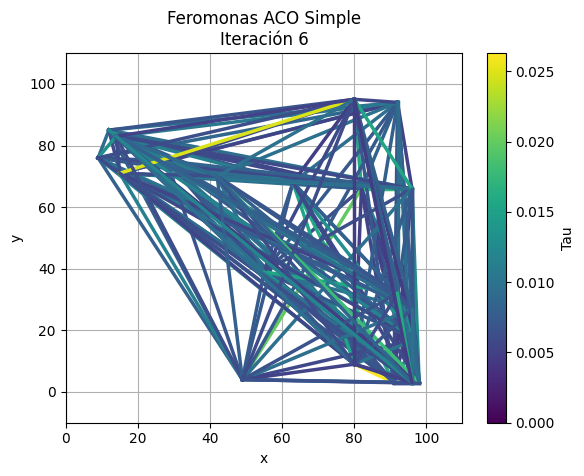

Iteración 7: Mejor Costo = 950.2440570784768


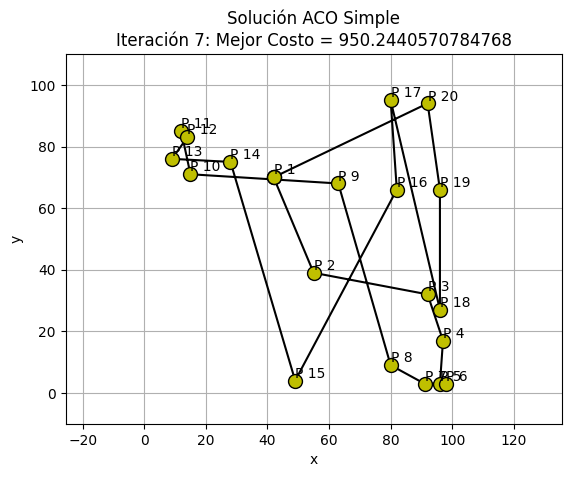

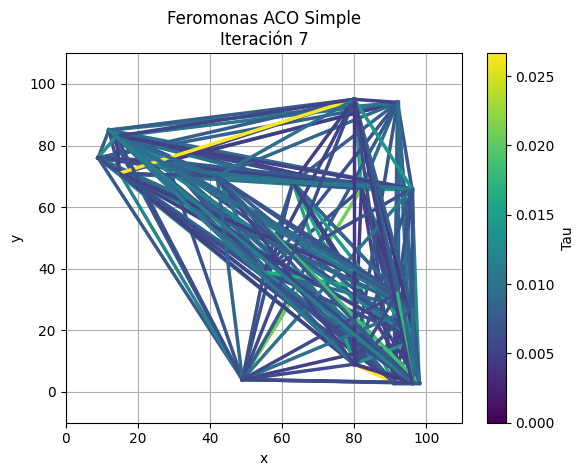

Iteración 8: Mejor Costo = 918.4657968665347


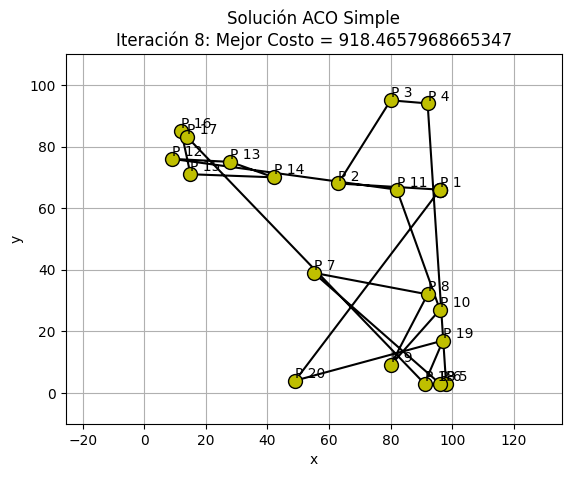

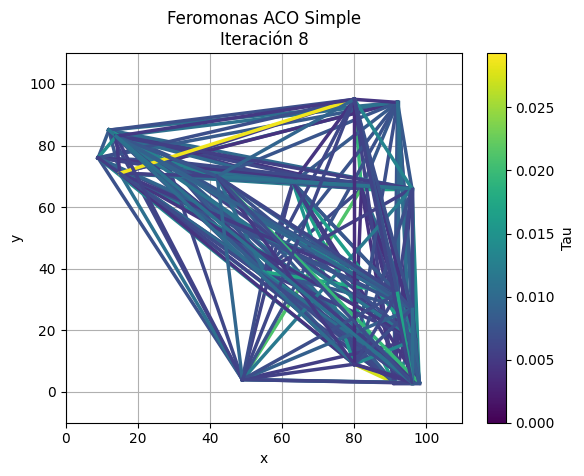

Iteración 9: Mejor Costo = 918.4657968665347


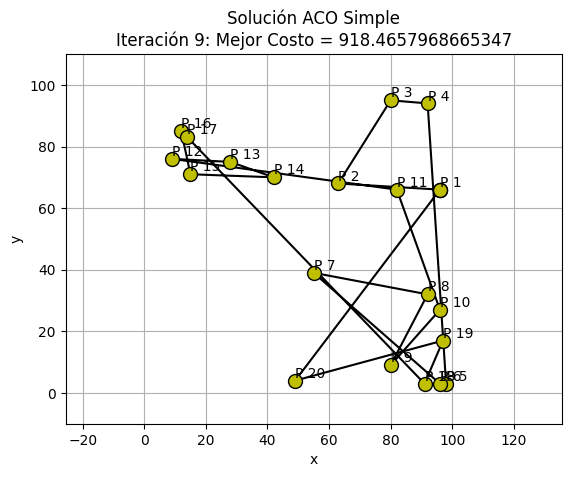

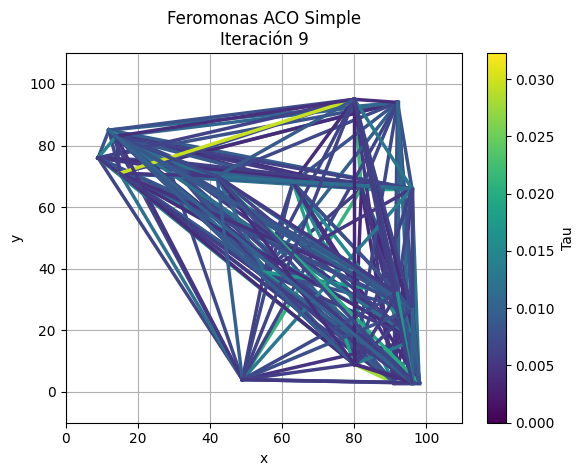

Iteración 10: Mejor Costo = 918.4657968665347


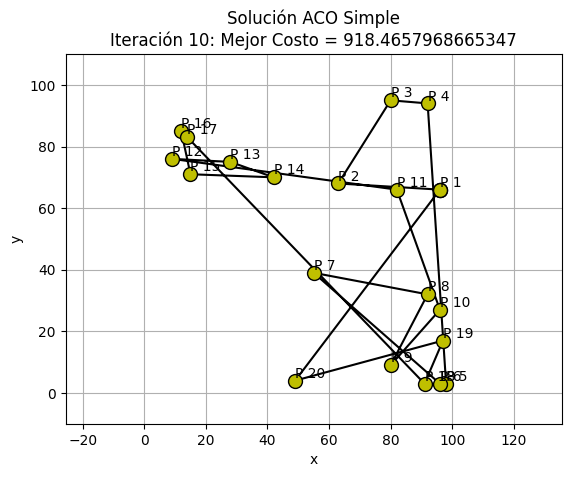

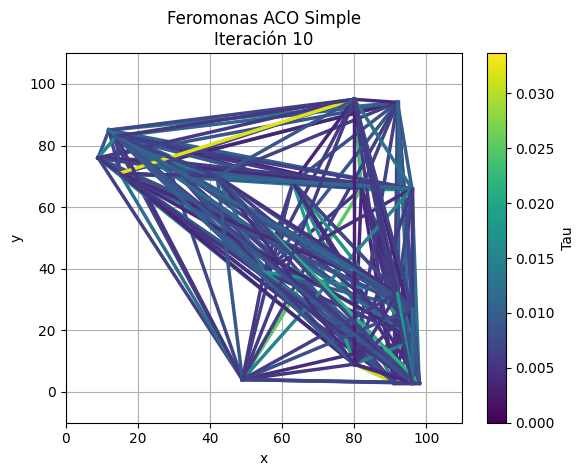

Iteración 11: Mejor Costo = 847.1801334318105


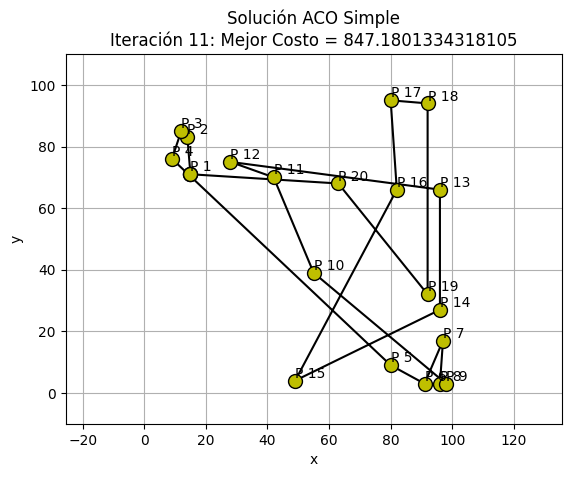

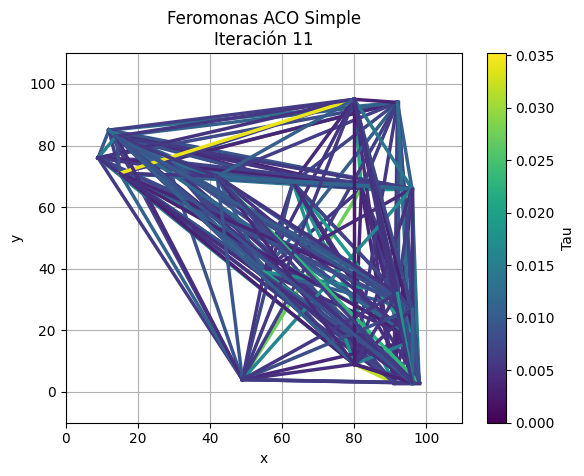

Iteración 12: Mejor Costo = 847.1801334318105


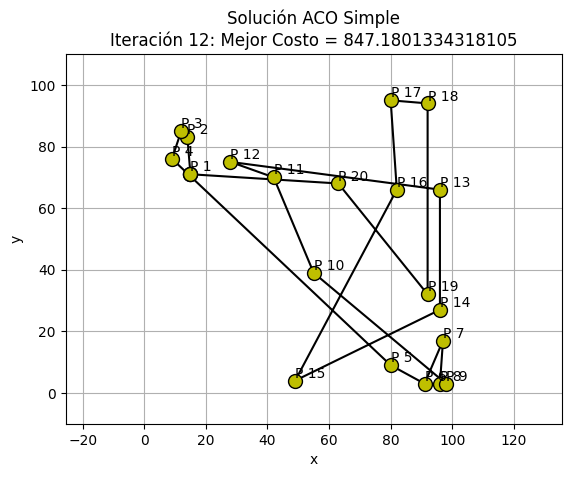

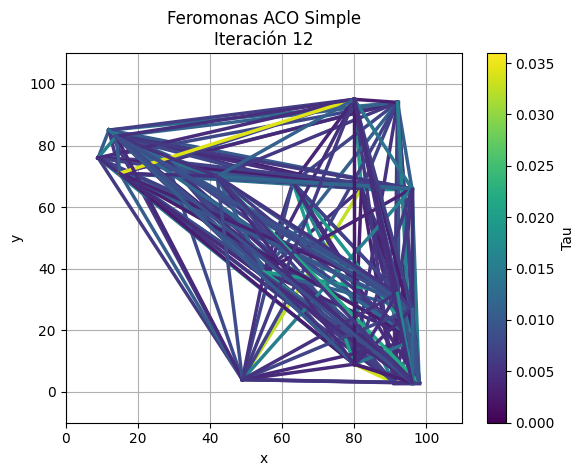

Iteración 13: Mejor Costo = 847.1801334318105


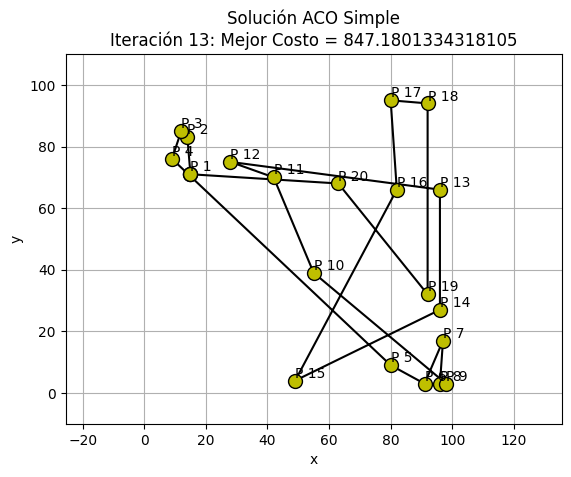

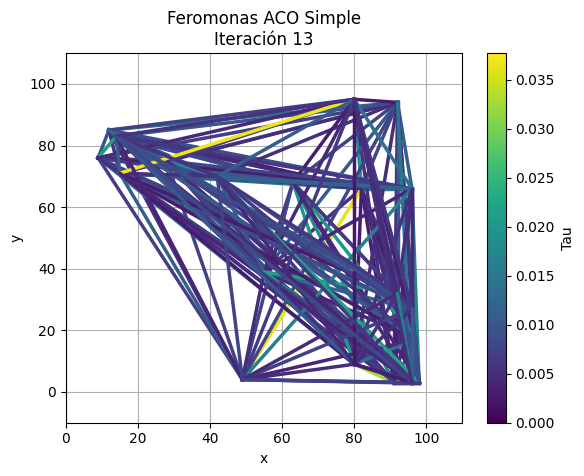

Iteración 14: Mejor Costo = 847.1801334318105


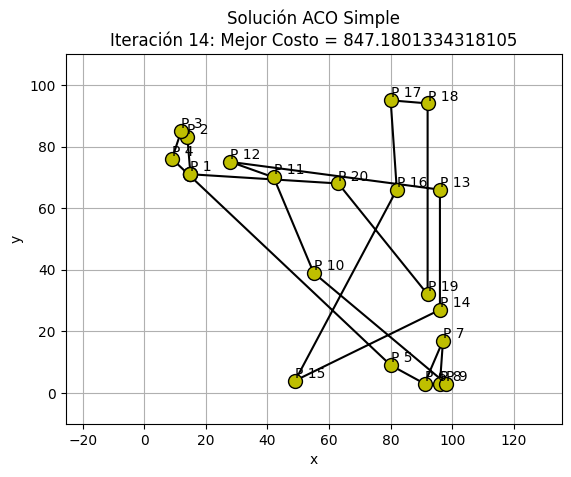

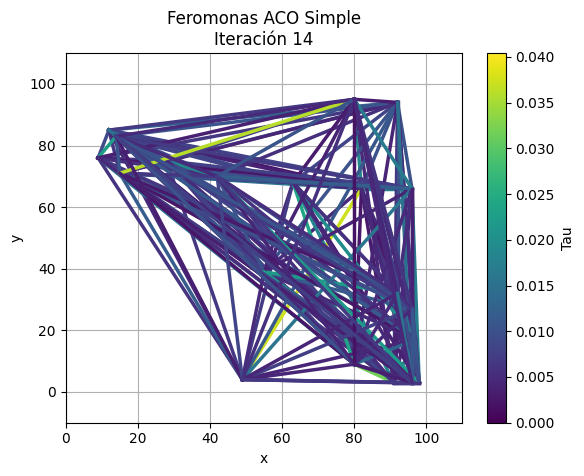

Iteración 15: Mejor Costo = 847.1801334318105


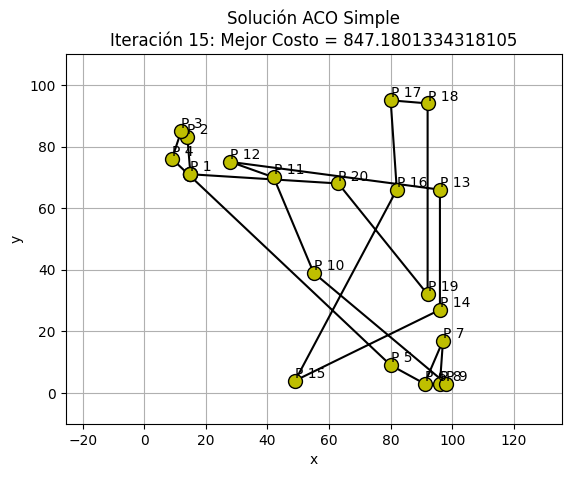

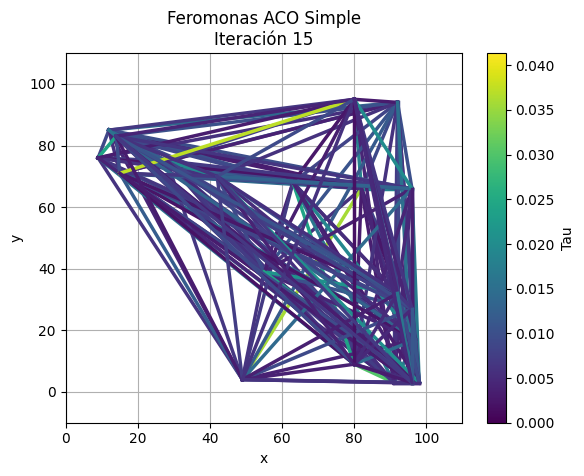

Iteración 16: Mejor Costo = 847.1801334318105


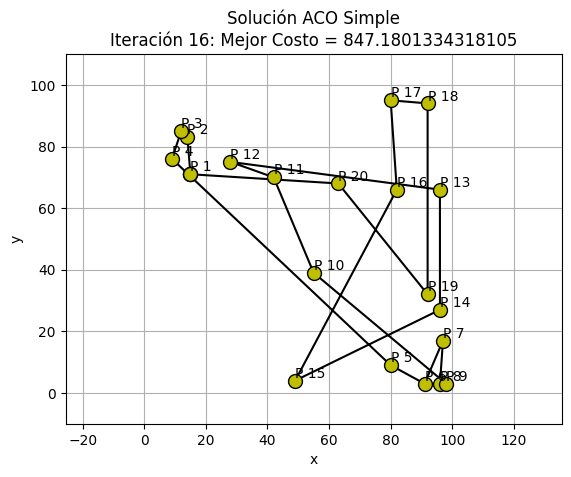

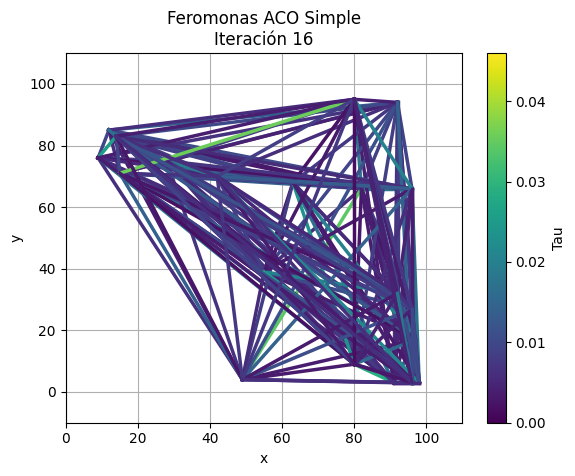

Iteración 17: Mejor Costo = 847.1801334318105


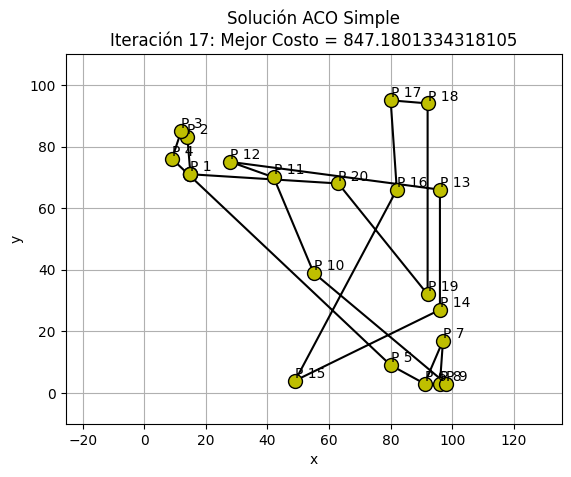

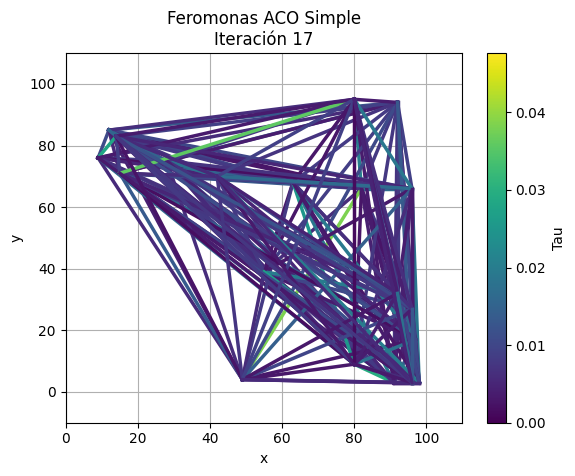

Iteración 18: Mejor Costo = 847.1801334318105


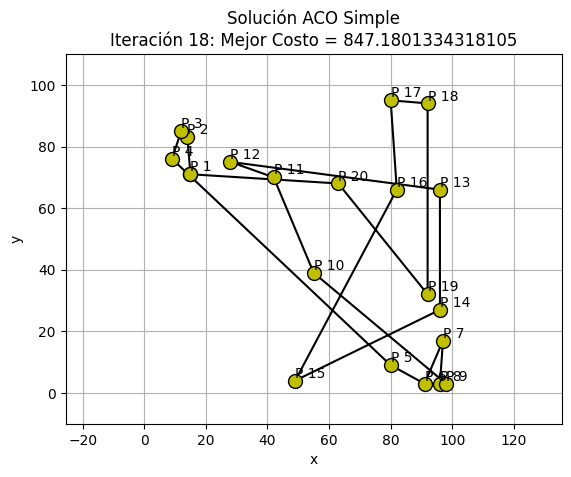

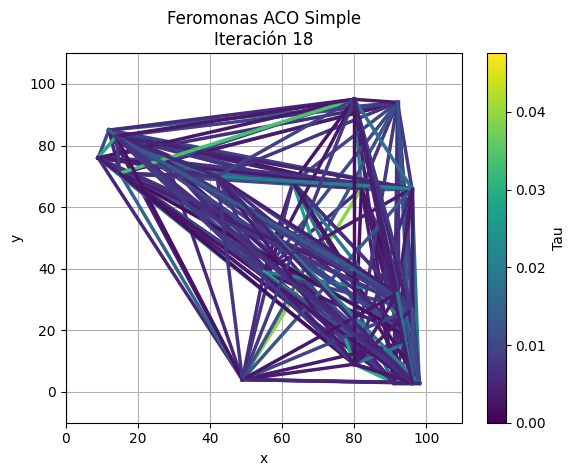

Iteración 19: Mejor Costo = 847.1801334318105


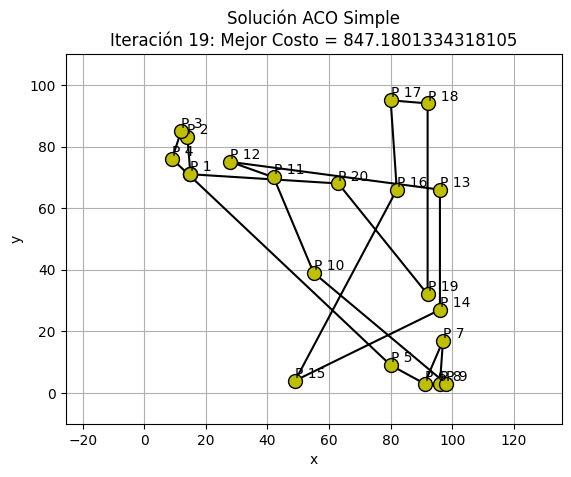

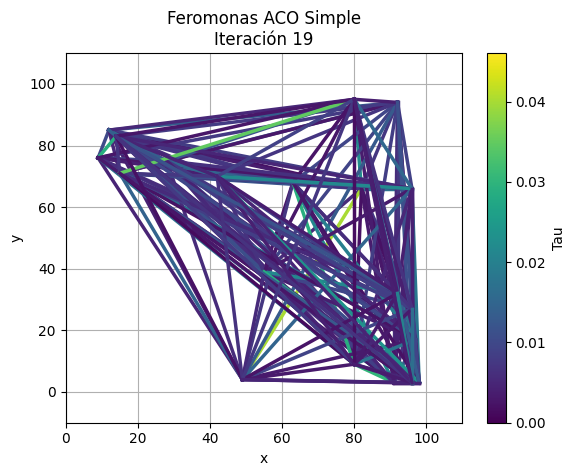

Iteración 20: Mejor Costo = 847.1801334318105


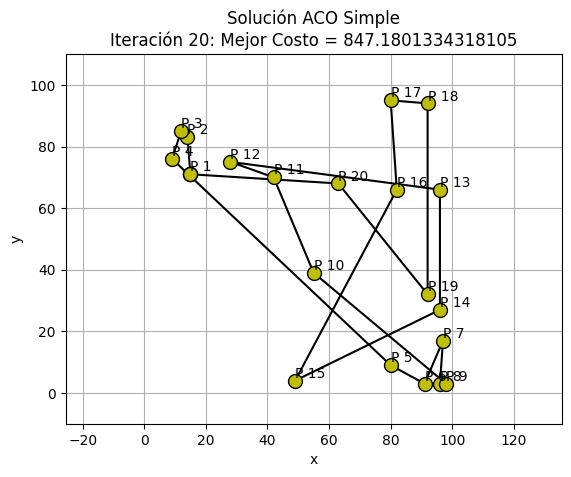

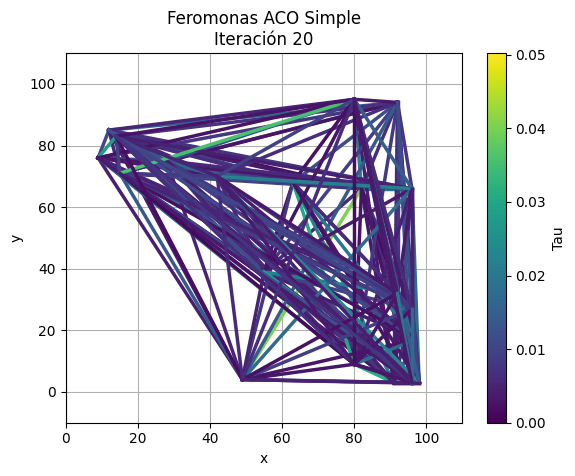

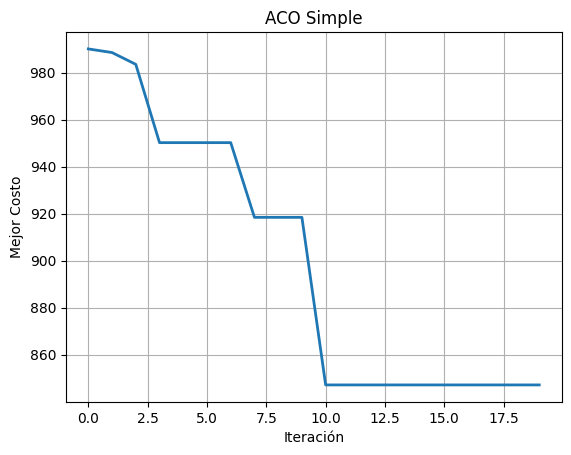

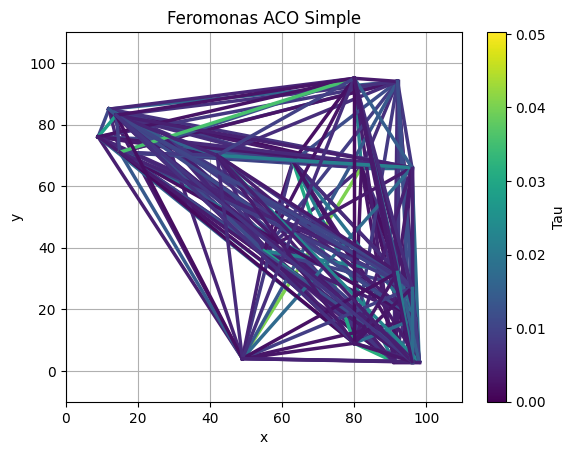


ELITIST ACO

Iteración 1: Mejor Costo = 971.477660275282


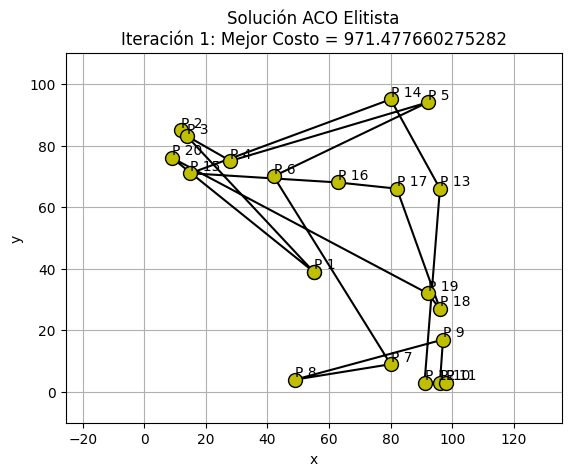

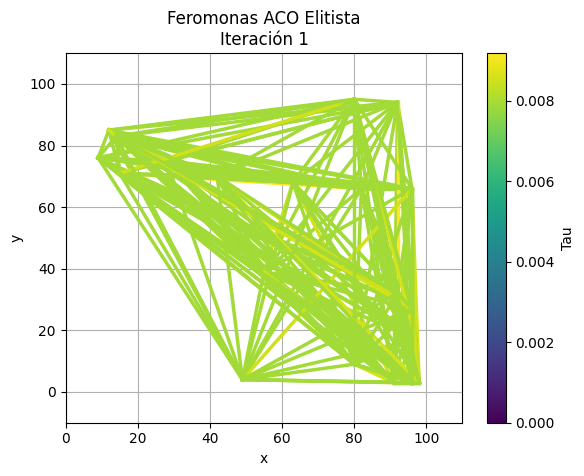

Iteración 2: Mejor Costo = 971.477660275282


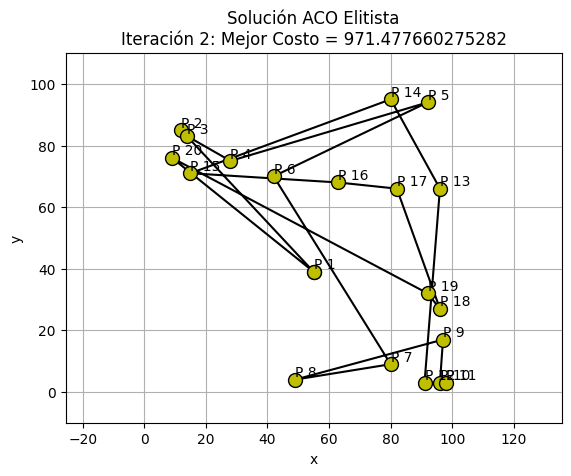

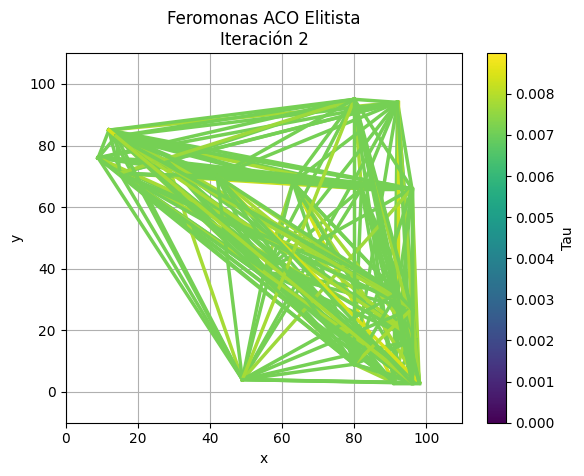

Iteración 3: Mejor Costo = 971.477660275282


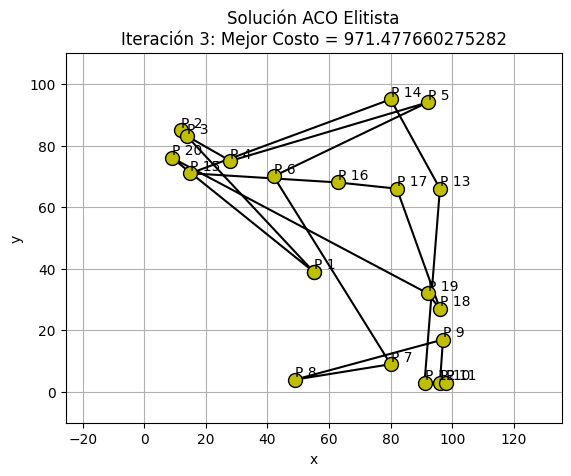

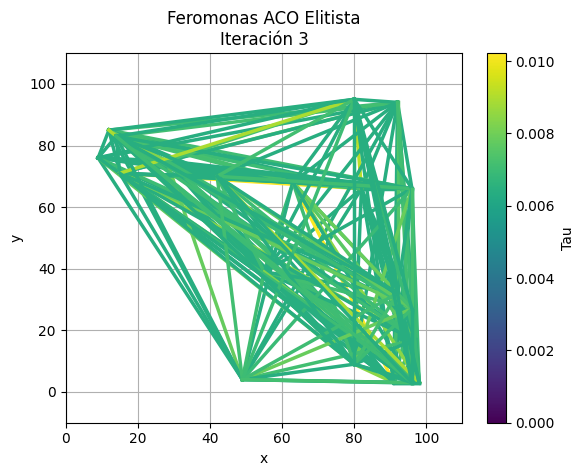

Iteración 4: Mejor Costo = 971.477660275282


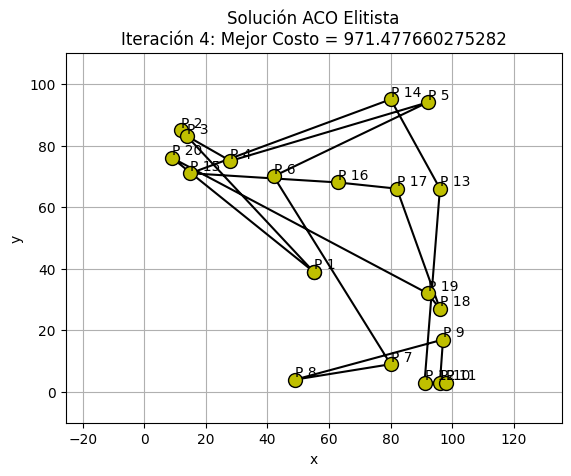

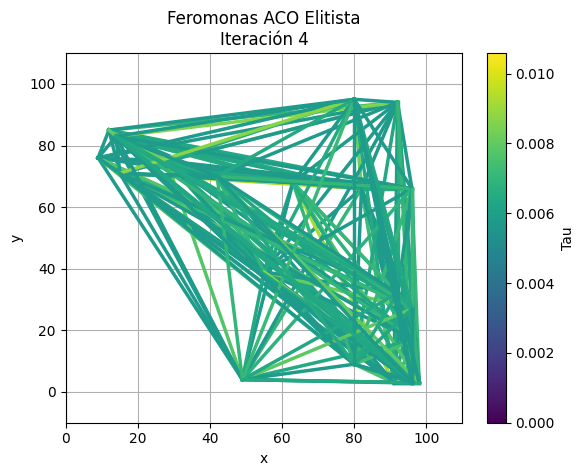

Iteración 5: Mejor Costo = 942.8366489158054


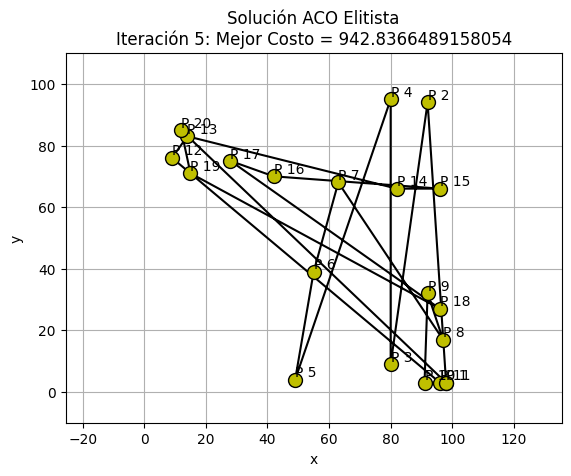

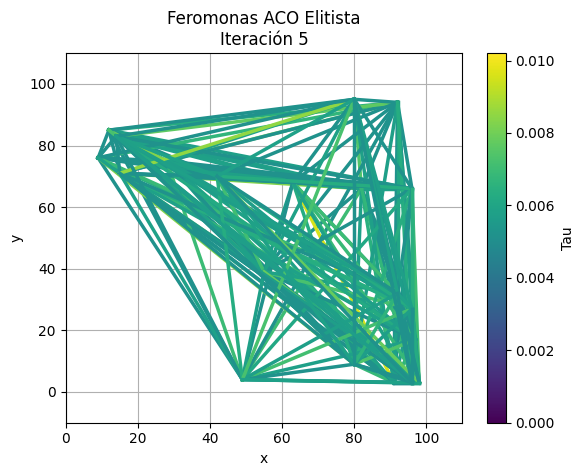

Iteración 6: Mejor Costo = 885.1307419411795


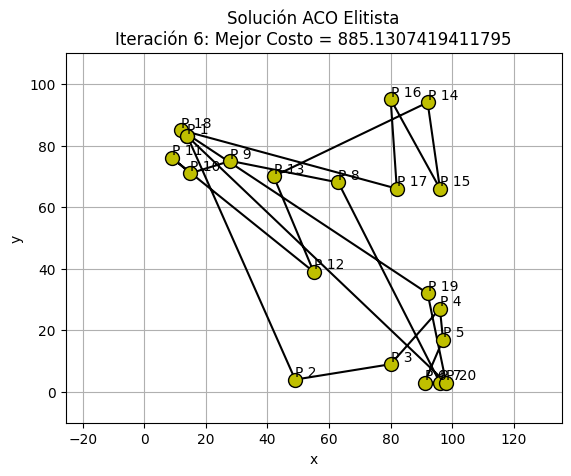

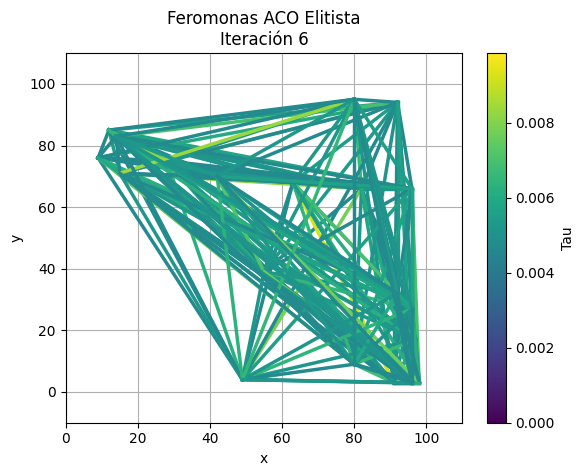

Iteración 7: Mejor Costo = 885.1307419411795


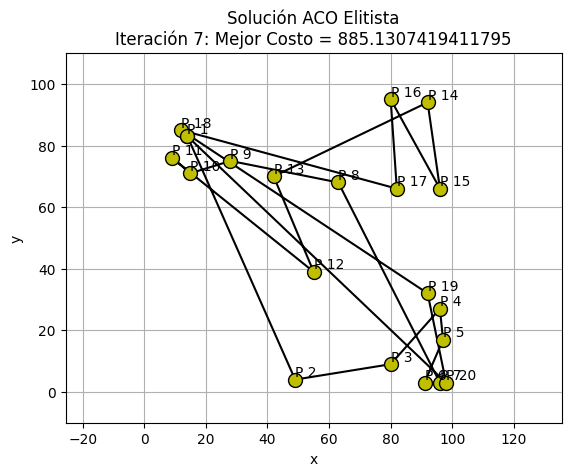

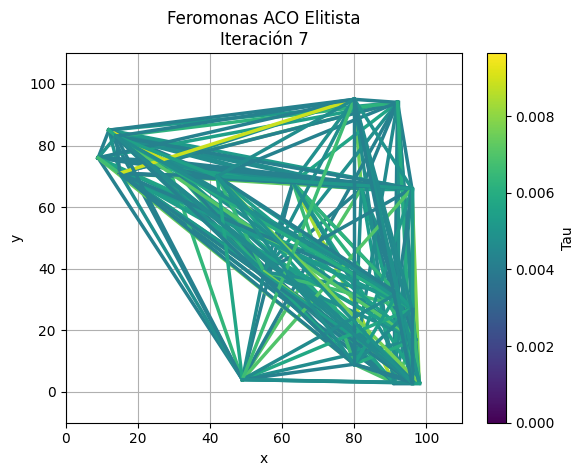

Iteración 8: Mejor Costo = 885.1307419411795


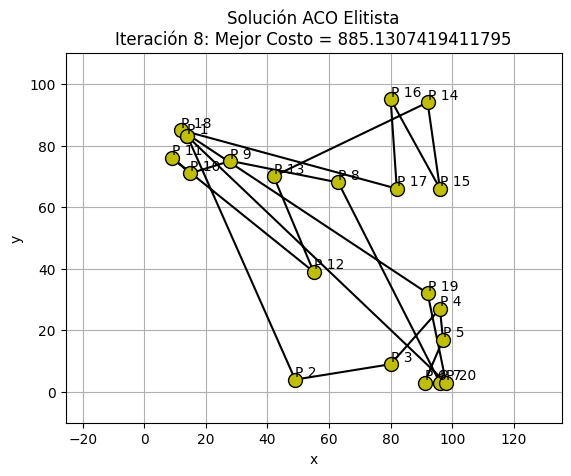

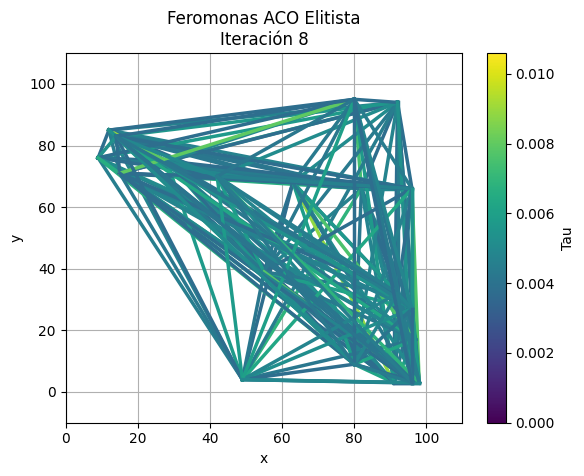

Iteración 9: Mejor Costo = 885.1307419411795


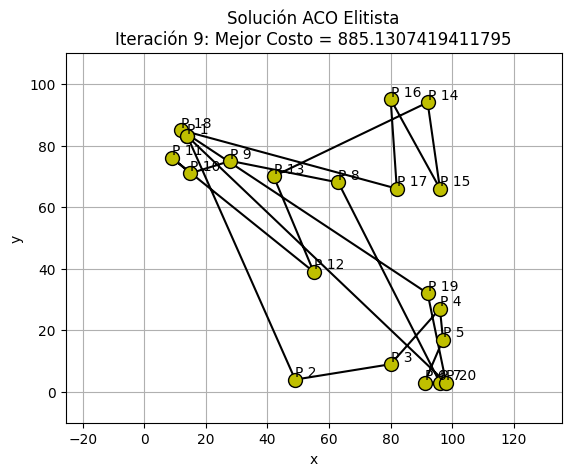

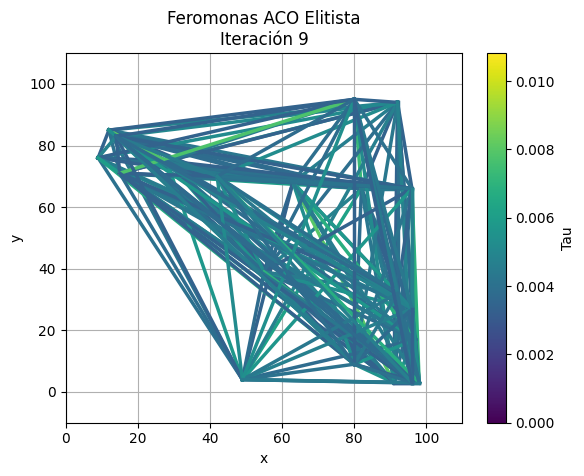

Iteración 10: Mejor Costo = 885.1307419411795


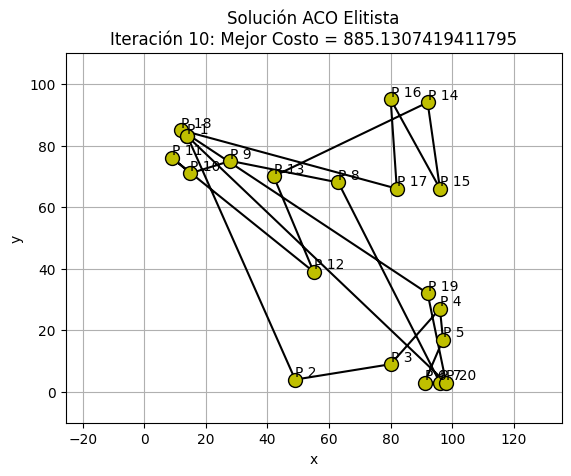

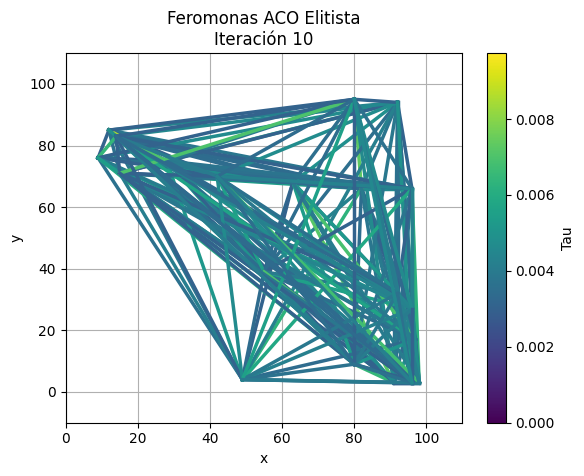

Iteración 11: Mejor Costo = 885.1307419411795


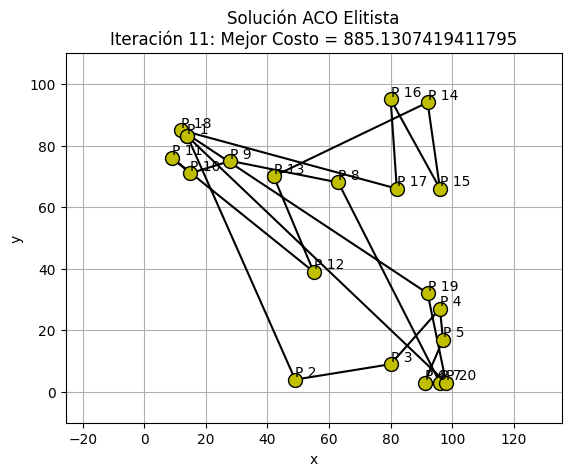

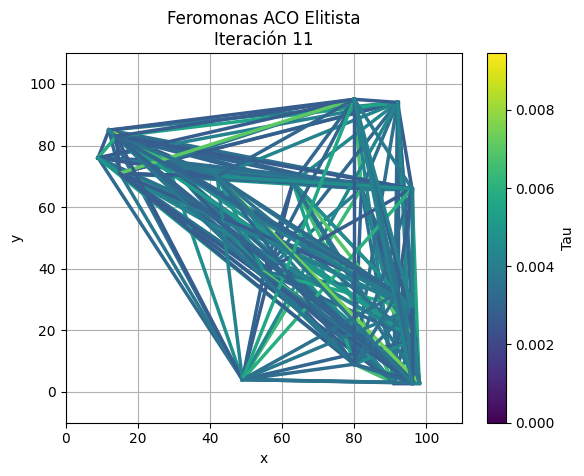

Iteración 12: Mejor Costo = 885.1307419411795


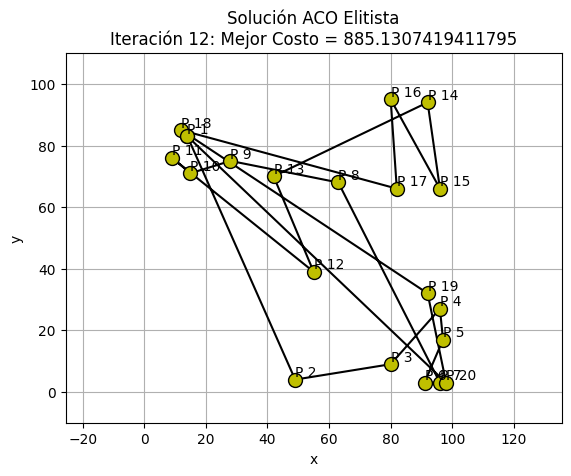

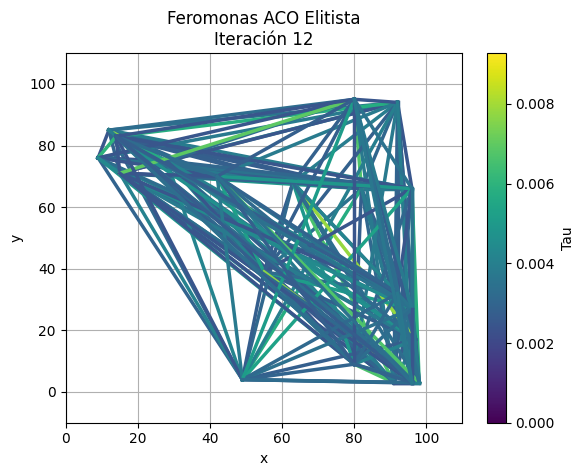

Iteración 13: Mejor Costo = 885.1307419411795


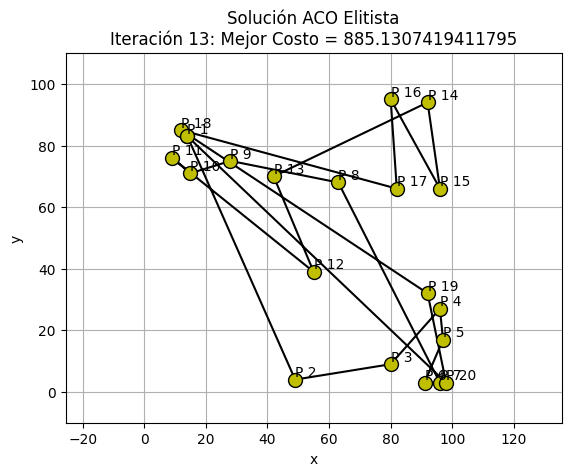

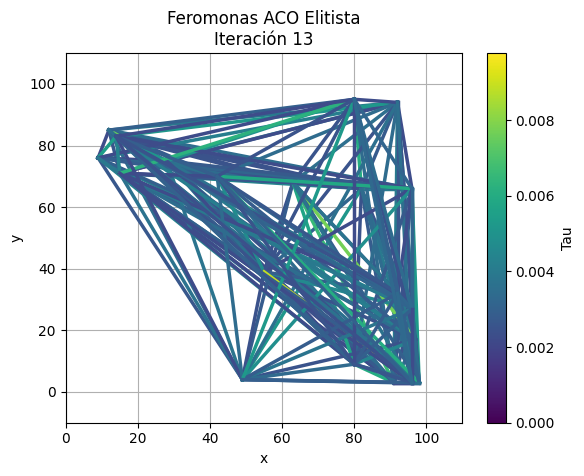

Iteración 14: Mejor Costo = 885.1307419411795


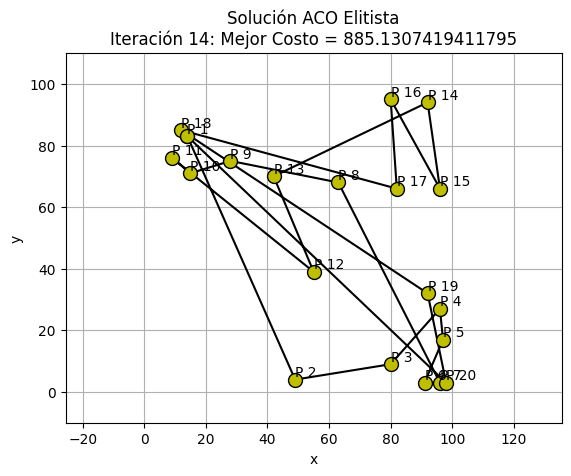

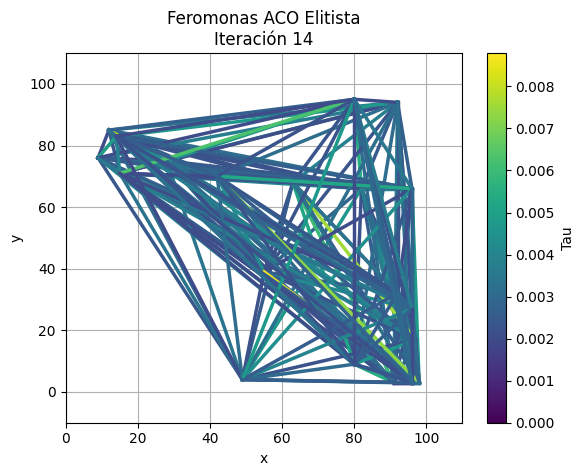

Iteración 15: Mejor Costo = 885.1307419411795


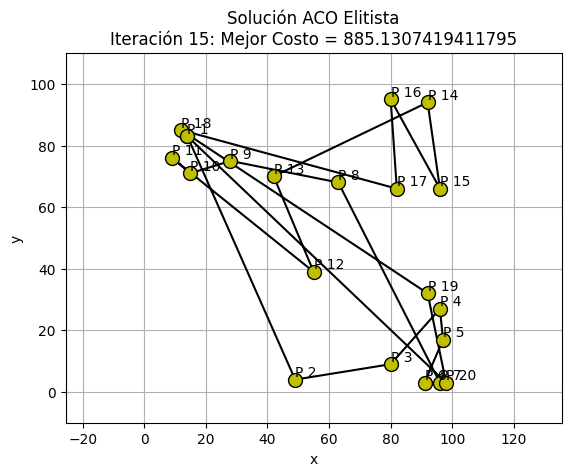

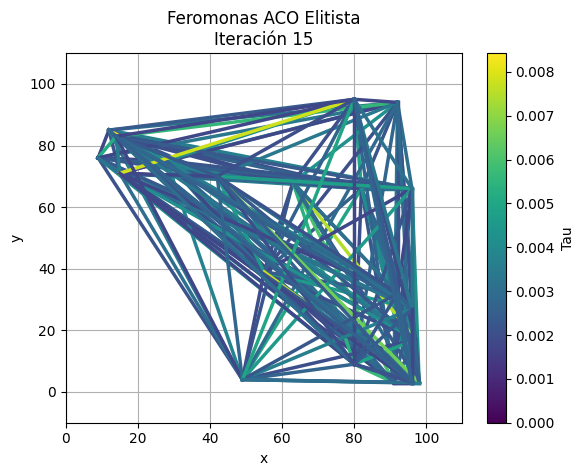

Iteración 16: Mejor Costo = 885.1307419411795


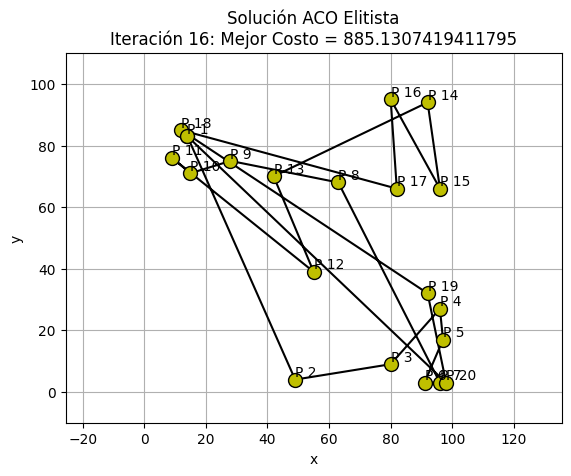

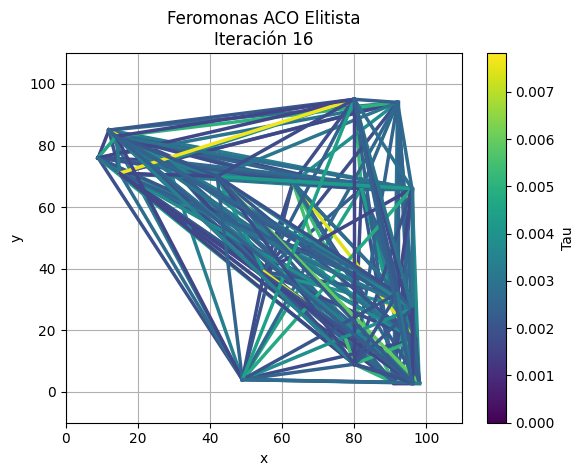

Iteración 17: Mejor Costo = 799.9763417236886


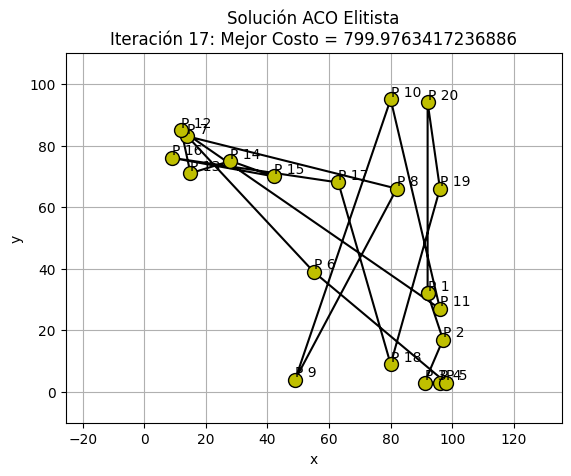

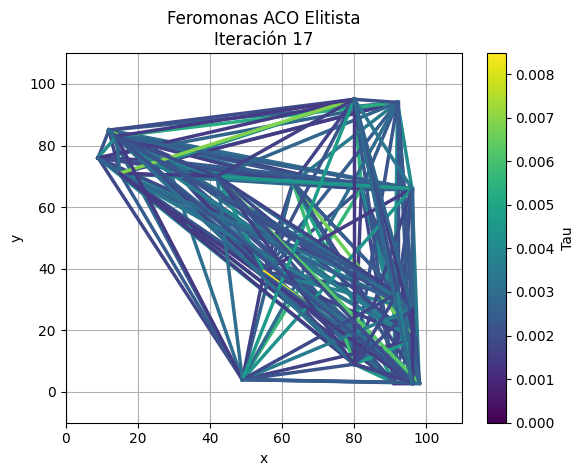

Iteración 18: Mejor Costo = 799.9763417236886


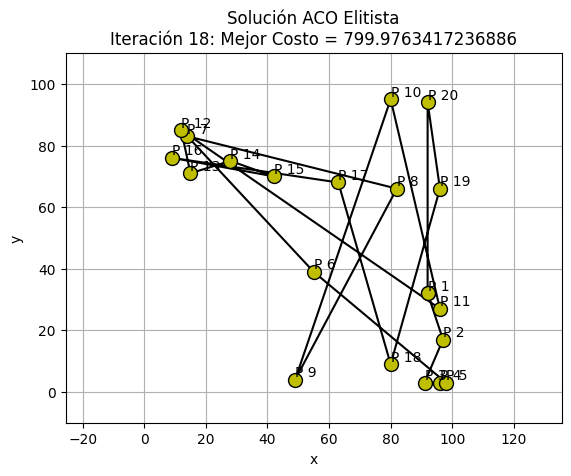

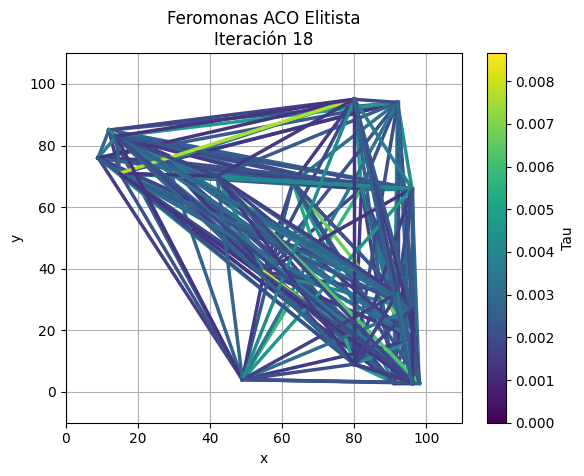

Iteración 19: Mejor Costo = 799.9763417236886


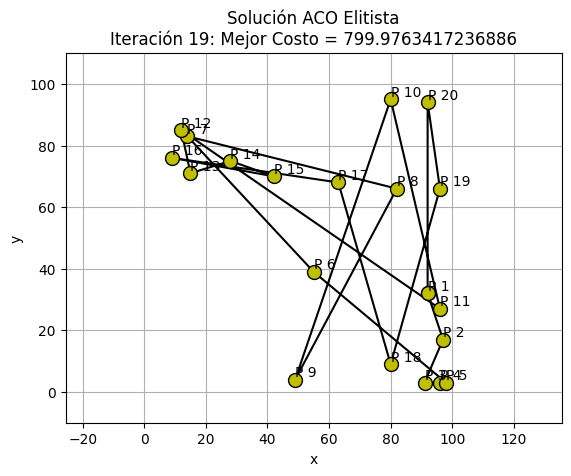

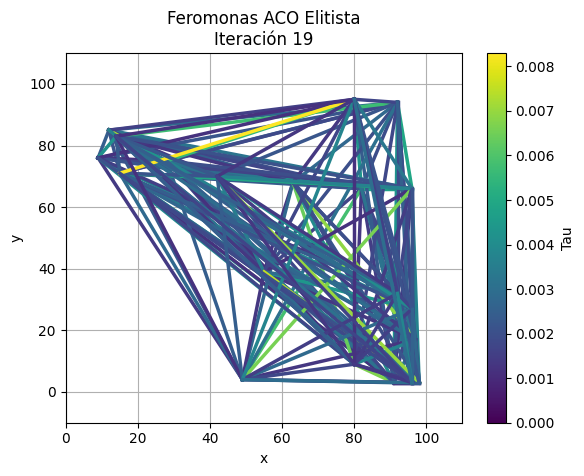

Iteración 20: Mejor Costo = 799.9763417236886


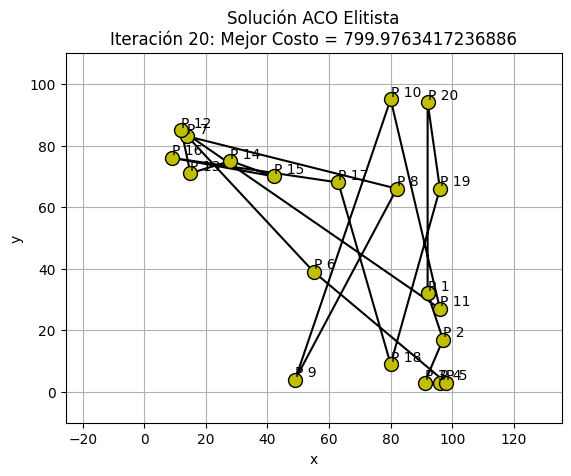

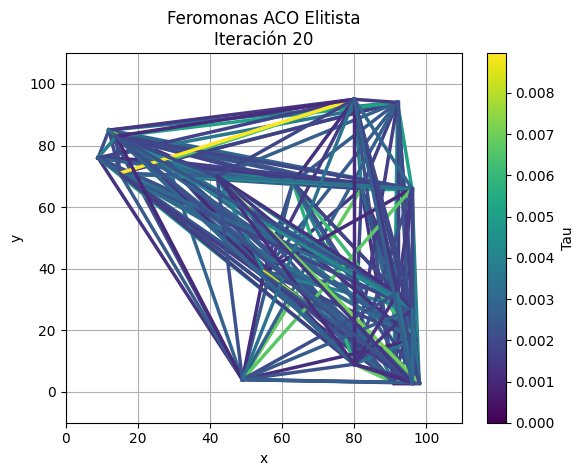

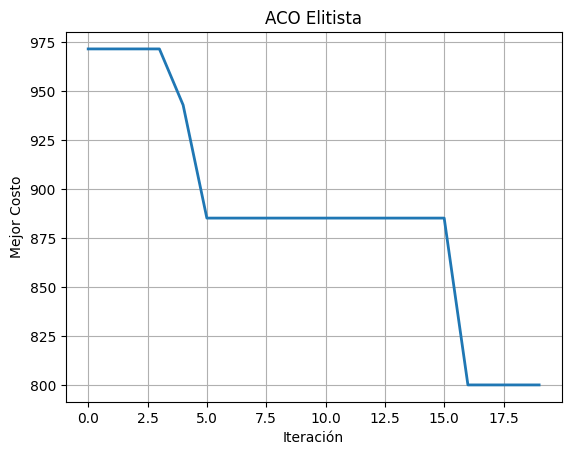

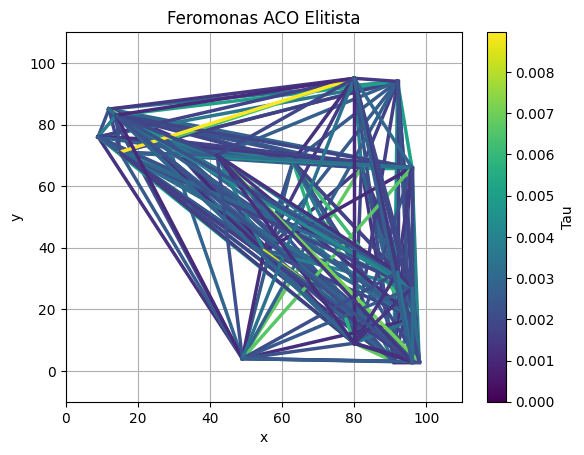



Solucion Simple: 847.1801334318105, Iteraciones necesarias: 11
Solucion Elitista: 799.9763417236886, Iteraciones necesarias: 17


In [ ]:
import numpy as np

def ant_colony_optimization():
    # Se define el problema
    model = create_model()
    cost_function = lambda tour: tour_length(tour, model)

    # Parametros
    max_it = 20
    n_ant = 20
    Q = 1
    tau0 = 10*Q/(model['n']*np.mean(model['D']))
    alpha = 1
    beta = 1
    rho = 0.1

    # ACO
    simple_sol = simple_aco(model, cost_function, max_it, n_ant, Q, tau0, alpha, beta, rho)

    p = 0.5  # Porcentaje de hormigas elitistas
    elitist_sol = elitist_aco(model, cost_function, max_it, n_ant, Q, tau0, alpha, beta, rho, p)

    print('\n')
    print(f'Solucion Simple: {simple_sol[0]}, Iteraciones necesarias: {simple_sol[1]}')
    print(f'Solucion Elitista: {elitist_sol[0]}, Iteraciones necesarias: {elitist_sol[1]}')

ant_colony_optimization()
